# Quantitative Value Strategy

In [19]:
########################################################################## LIBRARY IMPORT
import numpy as np
from bs4 import BeautifulSoup as bs
import pandas as pd
import pandas_datareader
from pandas_datareader import data as wb
import requests

##########################################################################
def get_fundamental_data(df):
    for symbol in df.index:

        url = ("http://finviz.com/quote.ashx?t=" + symbol.lower())
        soup = bs(requests.get(url).content)  # , features='html5lib')
        for m in df.columns:
            try:
                df.loc[symbol, m] = fundamental_metric(soup, m)
            except Exception as e:
                print(symbol, 'not found')
                print(e)
                break
    return df

def fundamental_metric(soup, metric):
    return soup.find(text=metric).find_next(class_='snapshot-td2').text

########################################### Define A List Of Stocks And The Fundamental Metrics
stock_list = ['NRZ']

# reserve tickers:
    # 

metric = ['Market Cap',
          'Income',
          'Dividend %',
          'P/E',
          'Debt/Eq',
          'EPS (ttm)',
          'ROA',
          'ROE',
          'ROI',
          'Gross Margin',
          'Oper. Margin',
           'Target Price',
           '52W Range',
           'RSI (14)',
           'Perf Month',
           'Perf Half Y',
           'Perf Year',
           'Perf YTD',
           'Beta',
           'Volatility',
           'SMA20',
           'SMA50',
           'SMA200'
]

##########################################################################
df = pd.DataFrame(index=stock_list,columns=metric)
df = get_fundamental_data(df)

print('')
print("All stocks with fundamental data")

df.to_csv(r'C:/Users/Gordon D. Pisciotta/Desktop/NRZ.csv')
new_df=pd.read_csv(r'C:/Users/Gordon D. Pisciotta/Desktop/NRZ.csv')

##########################################################################

new_df.columns = ['Ticker', 
                  'Market Cap',
          'Income',
          'Dividend %',
          'P/E',
          'Debt/Eq',
          'EPS (ttm)',
          'ROA',
          'ROE',
          'ROI',
          'Gross Margin',
          'Oper. Margin',
           'Target Price',
           '52W Range',
           'RSI (14)',
           'Perf Month',
           'Perf Half Y',
           'Perf Year',
           'Perf YTD',
           'Beta',
           'Volatility',
           'SMA20',
           'SMA50',
           'SMA200'
]

##########################################################################

#new_df.sort_values('Gross Margin', ascending=False, inplace = True) 

########################################################################## 

#new_df['Rank'] = range(len(stock_list))
#new_df.set_index('Rank', inplace=True)

##########################################################################

print(new_df)


All stocks with fundamental data
  Ticker Market Cap   Income Dividend %   P/E  Debt/Eq  EPS (ttm)    ROA  \
0    NRZ      1.87B  550.00M     37.81%  3.93     5.29       1.35  1.40%   

     ROE    ROI Gross Margin Oper. Margin  Target Price     52W Range  \
0  8.10%  1.40%       46.20%       25.50%         18.18  4.36 - 17.66   

   RSI (14) Perf Month Perf Half Y Perf Year Perf YTD  Beta     Volatility  \
0     18.15    -69.67%     -65.22%   -68.11%  -67.16%  1.71  49.99% 16.36%   

     SMA20    SMA50   SMA200  
0  -62.41%  -68.45%  -68.56%  


# Time Series Analysis and Forecasting

Enter Ticker: NRZ
Augmented Dickey-Fuller Test:
ADF Test Statistic : -1.7775739028776776
p-value : 0.39165108569366175
#Lags Used : 13
Number of Observations Used : 1722
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 
Augmented Dickey-Fuller Test:
ADF Test Statistic : -6.975497668032825
p-value : 8.449691616250449e-10
#Lags Used : 12
Number of Observations Used : 1722
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary

                                 Statespace Model Results                                 
Dep. Variable:                               Open   No. Observations:                 1736
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -548.532
Date:                            Tue, 24 Mar 2020   AIC                           1099.064
Time:                                    11:38:38   BIC                           1104.516
Sample:

Text(0.5, 0, 'Date')

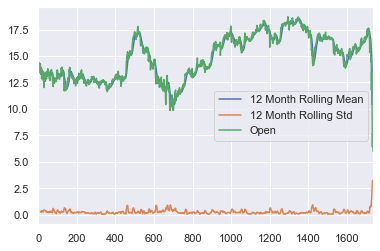

<Figure size 432x288 with 0 Axes>

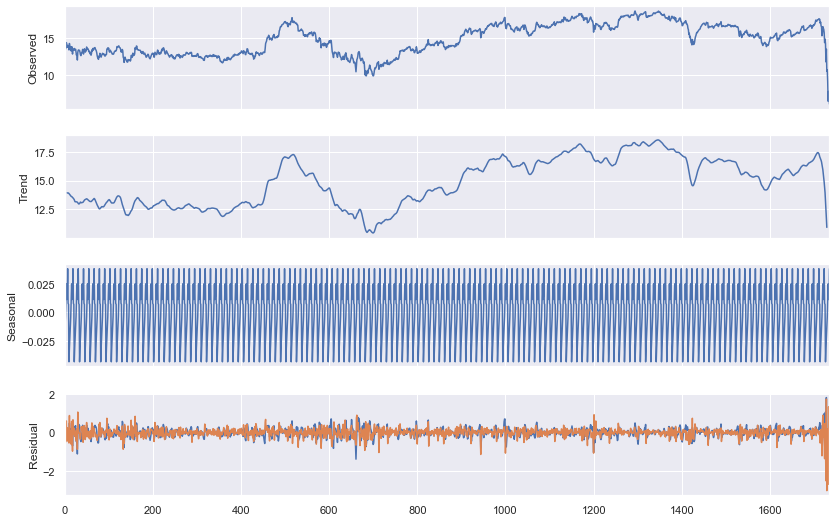

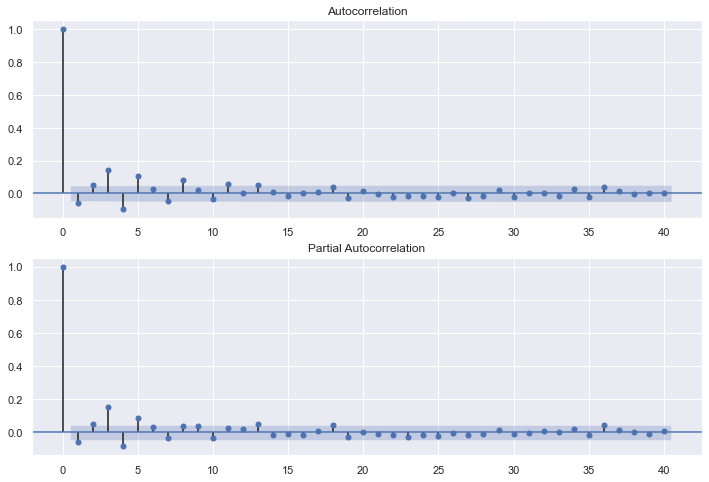

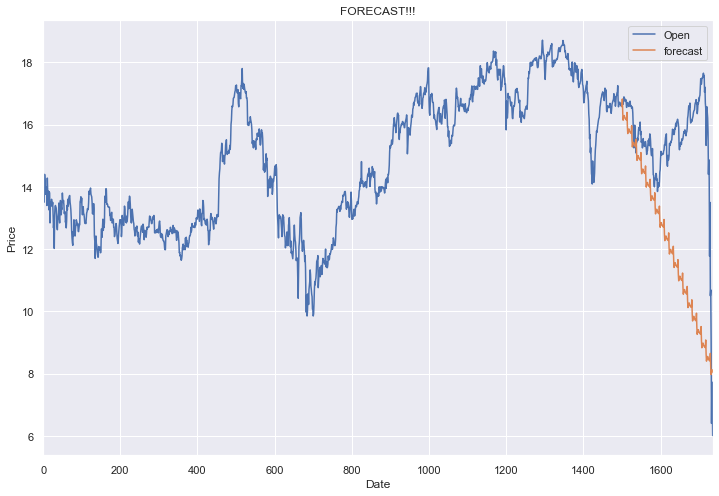

In [13]:
import numpy as np
import pandas as pd
import pandas_datareader as pdr
import statsmodels.api as sm
import datetime as datetime
import matplotlib.pyplot as plt
%matplotlib inline

TICKER = input('Enter Ticker: ')

df1=pdr.DataReader(TICKER, data_source='yahoo',start='2012-1-3')
df1.to_csv(r'C:/Users/Gordon D. Pisciotta/OneDrive/Desktop/111/NOTEBOOKS/temp/df1.csv')
df = pd.read_csv(r'C:/Users/Gordon D. Pisciotta/OneDrive/Desktop/111/NOTEBOOKS/temp/df1.csv')


df['Date1']=df['Date']
df.set_index('Date1')
timeseries = df['Open']


timeseries.rolling(12).mean().plot(label='12 Month Rolling Mean')
timeseries.rolling(12).std().plot(label='12 Month Rolling Std')
timeseries.plot()
plt.legend()


from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(df['Open'], freq=12)  
fig = plt.figure()  
fig = decomposition.plot()  
fig.set_size_inches(13, 8)


from statsmodels.tsa.stattools import adfuller

# Store in a function for later use!
def adf_check(time_series):
    """
    Pass in a time series, returns ADF report
    """
    result = adfuller(time_series)
    print('Augmented Dickey-Fuller Test:')
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']

    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")
        
adf_check(df['Open'])

df['Open First Difference'] = df['Open'] - df['Open'].shift(1)

adf_check(df['Open First Difference'].dropna())

df['Open First Difference'].plot()
print('')

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df['Open First Difference'].iloc[13:], lags=40, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df['Open First Difference'].iloc[13:], lags=40, ax=ax2)


model = sm.tsa.statespace.SARIMAX(df['Open'],order=(0,1,0), seasonal_order=(0,1,0,12))             
results = model.fit()          
print(results.summary())


df['forecast'] = results.predict(start = 1500, end= 2000, dynamic= True) 
df[['Open','forecast']].plot(figsize=(12,8))

plt.title('FORECAST!!!')
plt.ylabel('Price')
plt.xlabel('Date')

# BUY & SELL ORDER GENERATION:

Ticker: NRZ


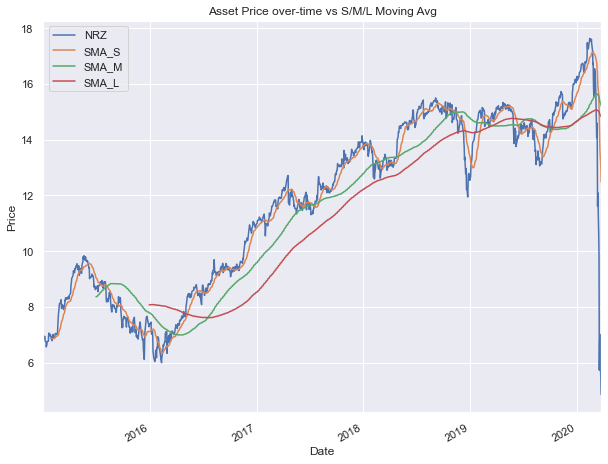

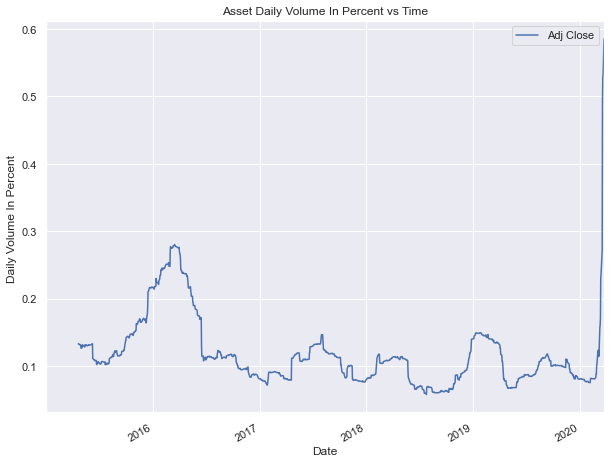

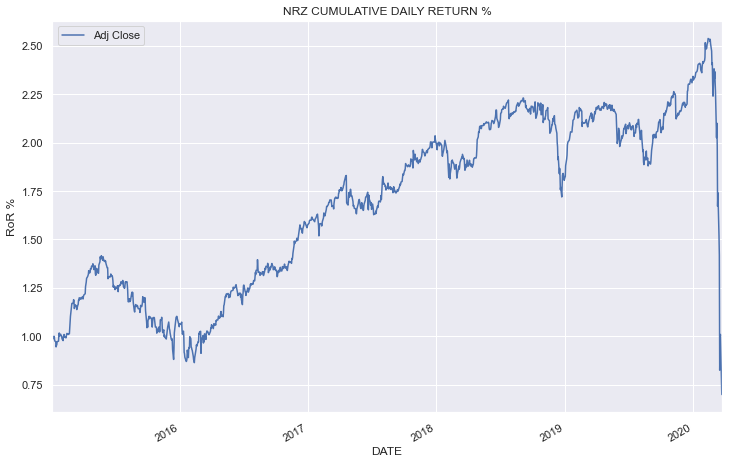

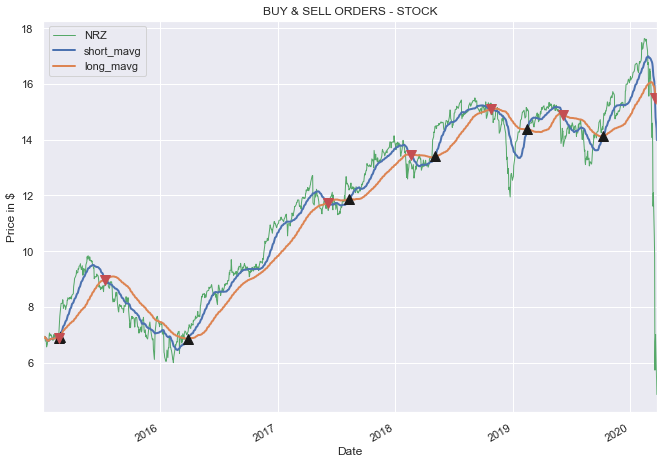

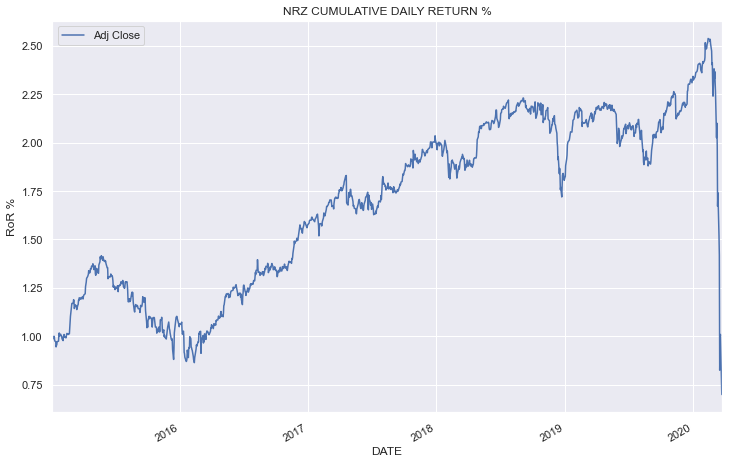

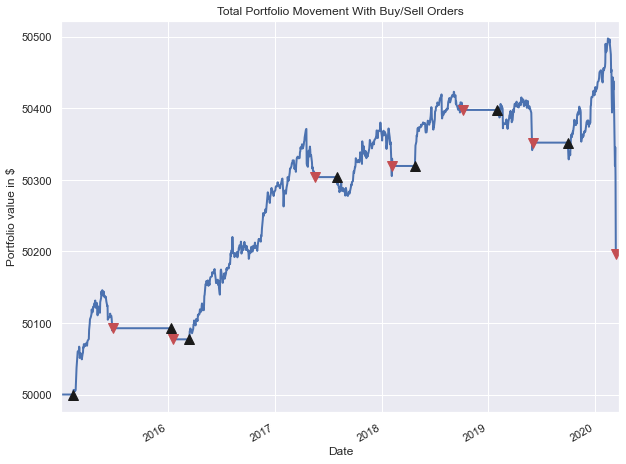

The Sharpe Ratio of NRZ = 35.39%



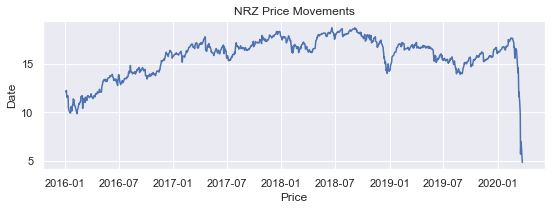

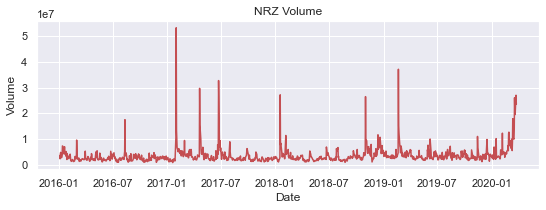

,Close,Volume
Date,,
2020-03-18,5.7300,26043000.0
2020-03-19,6.7500,20996900.0
2020-03-20,7.0100,19506900.0
2020-03-23,5.2900,27022600.0
2020-03-24,4.8599,23504464.0


In [14]:
######################### BUY & SELL ORDER GENERATION:
############## Build df Columns for SMA & LMA
import quandl
import yfinance as yf
from yahoofinancials import YahooFinancials
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import datetime as datetime
import pandas as pd
import pandas_datareader as pdr


ticker=input('Ticker: ')

start = datetime.datetime(2015,1,1)
end = datetime.date.today()

amzn = pdr.get_data_yahoo(ticker, start=start, end=end)
amzn.drop(['High','Low','Open','Close','Volume'], axis=1, inplace=True)
#amzn.head()


### Ratio Analysis
amzn_daily_close = amzn[['Adj Close']]
amzn_daily_pct_c = amzn_daily_close.pct_change()
amzn_daily_pct_c.fillna(0, inplace=True)

amzn_daily_pct_c = amzn_daily_close / amzn_daily_close.shift(1) - 1
amzn['Daily_S_RoR']=amzn_daily_pct_c['Adj Close']


### LOG Rate Of Return
amzn_daily_log_returns = np.log(amzn_daily_close.pct_change()+1)
amzn_daily_log_returns.head()
amzn['Daily_Log']=amzn_daily_log_returns['Adj Close']


### Monthly Return
monthly = amzn.resample('BM').apply(lambda x: x[-1])
#amzn['Monthly_RoR']=monthly['Adj Close']


### Quarterly Return
quarter = amzn.resample("4M").mean()
#amzn['Quarter_RoR']=quarter['Adj Close']


### Total Return
amzn_cum_daily_return = (1 + amzn_daily_pct_c).cumprod()
amzn['Total_RoR']=amzn_cum_daily_return['Adj Close']
amzn.rename(columns={'Adj Close': ticker}, inplace=True)


amzn_cum_monthly_return = amzn_cum_daily_return.resample("M").mean()
#amzn_cum_monthly_return

adj_close_px = amzn[ticker]
moving_avg = adj_close_px.rolling(window=40).mean()
#moving_avg[-10:]


amzn['SMA_S'] = adj_close_px.rolling(window=21).mean()
amzn['SMA_M'] = adj_close_px.rolling(window=126).mean()
amzn['SMA_L'] = adj_close_px.rolling(window=252).mean()

amzn[[ticker, 'SMA_S', 'SMA_M', 'SMA_L']].plot(figsize=(10, 8))
plt.ylabel('Price')
plt.title('Asset Price over-time vs S/M/L Moving Avg')

min_periods = 75 
vol = amzn_daily_pct_c.rolling(min_periods).std() * np.sqrt(min_periods) 
vol.plot(figsize=(10, 8))
plt.ylabel('Daily Volume In Percent ')
plt.title('Asset Daily Volume In Percent vs Time')

amzn_cum_daily_return.plot(figsize=(12,8))
plt.title(str(ticker)+' CUMULATIVE DAILY RETURN %')
plt.xlabel('DATE')
plt.ylabel('RoR %')

plt.show()
amzn.tail()

############################################################### Build df Columns for SMA & LMA
short_window = 30
long_window = 90
signals = pd.DataFrame(index=amzn.index)
signals['signal'] = 0.0
signals['short_mavg'] = amzn[ticker].rolling(window=short_window,
                                              min_periods=1, 
                                              center=False).mean()
signals['long_mavg'] = amzn[ticker].rolling(window=long_window, 
                                             min_periods=1, 
                                             center=False).mean()
signals['signal'][short_window:] = np.where(signals['short_mavg'][short_window:] 
                                            > signals['long_mavg'][short_window:], 
                                            1.0, 0.0) 
signals['positions'] = signals['signal'].diff()


### SIGNALS
signals=signals.replace({'signal': {1.0: 'Buy', 0.0: 'Sell'}})
signals['count']=signals.loc[signals.signal == 'Buy', ['count']] = 1.0
signals['count']=signals.loc[signals.signal == 'Sell', ['count']] = -1.0


### .............
fig = plt.figure(figsize=(11, 8))
ax1 = fig.add_subplot(111,  ylabel='Price in $')

amzn[ticker].plot(ax=ax1, color='g', lw=1)
signals[['short_mavg', 'long_mavg']].plot(ax=ax1, lw=2.)

ax1.plot(signals.loc[signals.positions == 1.0].index, 
         signals.short_mavg[signals.positions == 1.0],
         '^', markersize=10, color='k')
         
ax1.plot(signals.loc[signals.positions == -1.0].index, 
         signals.short_mavg[signals.positions == -1.0],
         'v', markersize=10, color='r')

plt.title('BUY & SELL ORDERS - STOCK')
plt.legend()
plt.show()

signals.tail()

######################################################## Evaluate Short Moving Average(SMA) vs Long Moving Average
short_window = 21
long_window = 63
signals = pd.DataFrame(index=amzn.index)
signals['signal'] = 0.0
signals['short_mavg'] = amzn[ticker].rolling(window=short_window, min_periods=1, center=False).mean()
signals['long_mavg'] = amzn[ticker].rolling(window=long_window, min_periods=1, center=False).mean()
signals['signal'][short_window:] = np.where(signals['short_mavg'][short_window:] 
                                            > signals['long_mavg'][short_window:], 1.0, 0.0) 
signals['positions'] = signals['signal'].diff()


## Set Portfolio 
initial_capital= float(50000.0)
positions = pd.DataFrame(index=signals.index).fillna(0.0)
positions['stock'] = 50*signals['signal']   
portfolio = positions.multiply(amzn[ticker], axis=0)
pos_diff = positions.diff()
portfolio['holdings'] = (positions.multiply(amzn[ticker],
                                            axis=0)).sum(axis=1)
portfolio['cash'] = initial_capital -(pos_diff.multiply(amzn[ticker],
                                                        axis=0)).sum(axis=1).cumsum()
portfolio['total'] = portfolio['cash'] + portfolio['holdings']
portfolio['returns'] = portfolio['total'].pct_change()


### SHARPE RATIO
returns = portfolio['returns']
portfolio_ror=np.sqrt(252) * (returns.mean() / returns.std())


### CONSTRUCT ORDERS
amzn_cum_daily_return.plot(figsize=(12,8))
plt.title(str(ticker)+' CUMULATIVE DAILY RETURN %')
plt.xlabel('DATE')
plt.ylabel('RoR %')

fig = plt.figure(figsize=(10, 8))
ax1 = fig.add_subplot(111, ylabel='Portfolio value in $')
portfolio['total'].plot(ax=ax1, lw=2.)

ax1.plot(portfolio.loc[signals.positions == 1.0].index, 
         portfolio.total[signals.positions == 1.0],
         '^', markersize=10, color='k')

ax1.plot(portfolio.loc[signals.positions == -1.0].index, 
         portfolio.total[signals.positions == -1.0],
         'v', markersize=10, color='r')

plt.title('Total Portfolio Movement With Buy/Sell Orders')
plt.show()

print ("The Sharpe Ratio of "+ticker+" = "+"{0:.2%}".format(portfolio_ror))
print('')
portfolio.tail()


############################################################ Demo
import quandl
import yfinance as yf
from yahoofinancials import YahooFinancials
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import pandas_datareader as pdr


### ............
ticker=ticker
start = datetime.datetime(2016,1,1)
end = datetime.date.today()

amzn = pdr.get_data_yahoo(ticker, 
                          start=start,
                          end=end)
amzn.drop(['High','Low','Open','Adj Close'],
          axis=1, inplace=True)


### ...........
fig = plt.figure(figsize=(9,6))
plt.subplot(211)
plt.plot(amzn['Close'])
plt.title(str(ticker)+' Price Movements')
plt.ylabel('Date')
plt.xlabel('Price')
plt.show()

fig = plt.figure(figsize=(9,6))
plt.subplot(212)
plt.plot(amzn['Volume'], color='r')
plt.title(str(ticker)+' Volume')
plt.ylabel('Volume')
plt.xlabel('Date')

plt.show()
amzn.tail()



# Monte Carlo Simulations

Enter Asset: NRZ
[*********************100%***********************]  1 of 1 completed
Downloaded 306 rows of data.


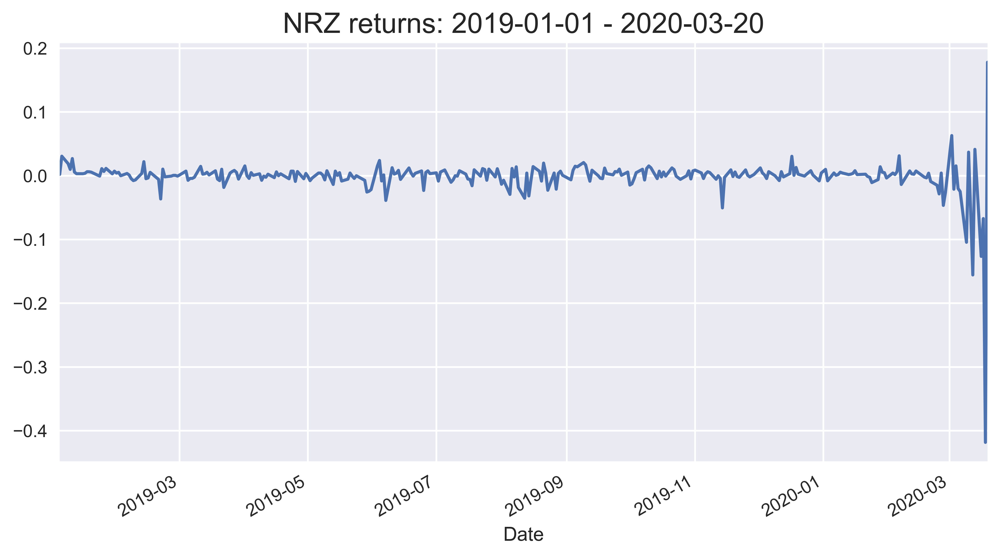

Average return: -0.14%


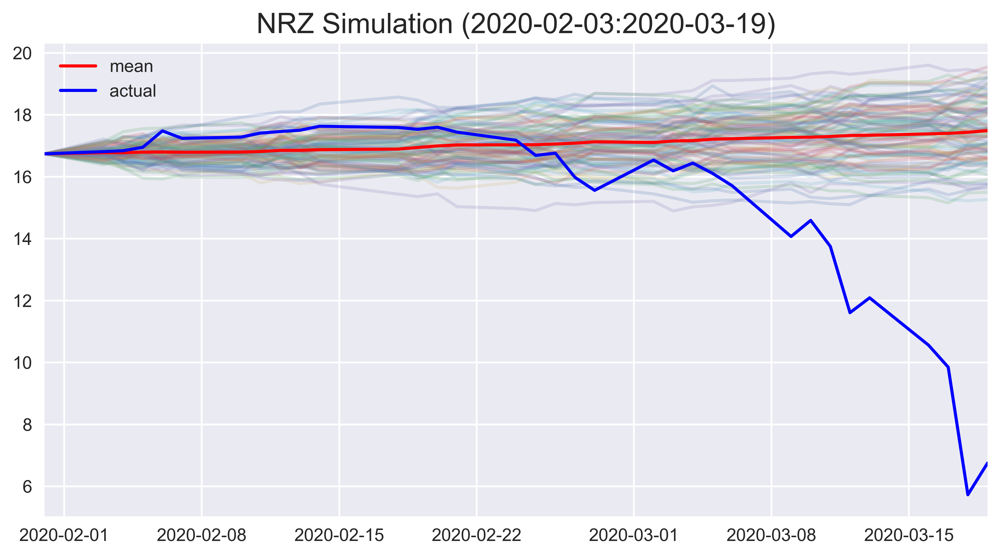

In [15]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import warnings
plt.style.use('seaborn')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)
import numpy as np
import pandas as pd
import yfinance as yf


### 2. Define parameters for downloading data:
RISKY_ASSET = input('Enter Asset: ')
START_DATE = '2019-01-01'
END_DATE = '2020-03-20'


### 3. Download data from Yahoo Finance:
df = yf.download(RISKY_ASSET, start=START_DATE, 
                 end=END_DATE, adjusted=True)
print(f'Downloaded {df.shape[0]} rows of data.')


### 4. Calculate daily returns:
adj_close = df['Adj Close']
returns = adj_close.pct_change().dropna()

ax = returns.plot()
ax.set_title(f'{RISKY_ASSET} returns: {START_DATE} - {END_DATE}', 
             fontsize=16)

plt.tight_layout()
#plt.savefig(r'C:/Users/Gordon D. Pisciotta/OneDrive/Desktop/NOTEBOOKS/temp/images/ch6_im1.png')
plt.show()

print(f'Average return: {100 * returns.mean():.2f}%')


### 5. Split data into the training and test sets:
train = returns['2019-01-01':'2020-01-31']
test = returns['2020-02-01':'2030-03-20']


### 6. Specify the parameters of the simulation:
T = len(test)
N = len(test)
S_0 = adj_close[train.index[-1].date()]
N_SIM = 100
mu = train.mean()
sigma = train.std()



### 7. Define the function used for simulations:
def simulate_gbm(s_0, mu, sigma, n_sims, T, N, 
                 random_seed=42):
    '''
    Function used for simulating stock returns using Geometric Brownian Motion.
    
    Parameters
    ------------
    s_0 : float
        Initial stock price
    mu : float
        Drift coefficient
    sigma : float
        Diffusion coefficient
    n_sims : int
        Number of simulations paths
    dt : float
        Time increment, most commonly a day
    T : float
        Length of the forecast horizon, same unit as dt
    N : int
        Number of time increments in the forecast horizon
    random_seed : int
        Random seed for reproducibility

    Returns
    -----------
    S_t : np.ndarray
        Matrix (size: n_sims x (T+1)) containing the simulation results. 
        Rows respresent sample paths, while columns point of time.
    '''
    np.random.seed(random_seed)
    
    dt = T/N
    dW = np.random.normal(scale = np.sqrt(dt), size=(n_sims, N))
    W = np.cumsum(dW, axis=1)
    
    time_step = np.linspace(dt, T, N)
    time_steps = np.broadcast_to(time_step, (n_sims, N))
    
    S_t = s_0 * np.exp((mu - 0.5 * sigma**2) * time_steps 
                       + sigma * W)
    S_t = np.insert(S_t, 0, s_0, axis=1)
    
    return S_t


### 8. Run the simulations:
gbm_simulations = simulate_gbm(S_0, mu, sigma, N_SIM, T, N)


### 9. Plot simulation results:
# prepare objects for plotting 
last_train_date = train.index[-1].date()
first_test_date = test.index[0].date()
last_test_date = test.index[-1].date()
plot_title = (f'{RISKY_ASSET} Simulation '
              f'({first_test_date}:{last_test_date})')

selected_indices = adj_close[last_train_date:last_test_date].index
index = [date.date() for date in selected_indices]

gbm_simulations_df = pd.DataFrame(np.transpose(gbm_simulations), 
                                  index=index)

# plotting
ax = gbm_simulations_df.plot(alpha=0.2, legend=False)
line_1, = ax.plot(index, gbm_simulations_df.mean(axis=1), 
                  color='red')
line_2, = ax.plot(index, adj_close[last_train_date:last_test_date], 
                  color='blue')
ax.set_title(plot_title, fontsize=16)
ax.legend((line_1, line_2), ('mean', 'actual'))

plt.tight_layout()
#plt.savefig(r'C:/Users/Gordon D. Pisciotta/OneDrive/Desktop/NOTEBOOKS/temp/images/ch6_im2.png')
plt.show()

# Visualization and Analysis

Enter Tickers: NRZ
[*********************100%***********************]  1 of 1 completed


Start date,2015-03-25
End date,2020-03-24
Total months,59
,Backtest
Annual return,-10.1%
Cumulative returns,-41.4%
Annual volatility,34.6%
Sharpe ratio,-0.11
Calmar ratio,-0.14
Stability,0.74
Max drawdown,-72.5%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,72.49,2020-02-14,2020-03-24,NaT,NaN
1,39.02,2015-05-22,2016-02-11,2016-11-18,391
2,22.93,2018-09-05,2018-12-24,2019-11-01,303
3,11.07,2017-04-19,2017-07-06,2017-09-27,116
4,10.96,2017-12-28,2018-02-08,2018-05-01,89


Stress Events,mean,min,max
Fall2015,-0.34%,-5.04%,2.78%
New Normal,-0.02%,-41.83%,17.80%


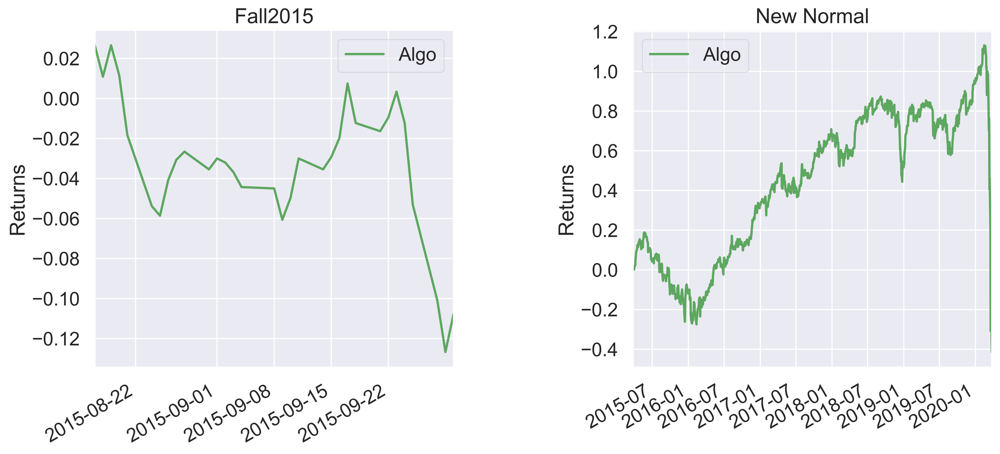

In [16]:
import pyfolio as pf
import pandas as pd
import numpy as np
import yfinance as yf


############################### Define the ticker list
#tickers_list = ['AMZN']
tickers_list=[input('Enter Tickers: ')]

################################ Import pandas and create a placeholder for the data
data = pd.DataFrame(columns=tickers_list)

# Feth the data
for ticker in tickers_list:
    data[ticker] = yf.download(ticker, period='5y',)['Adj Close']

######## Compute the returns of individual stocks and then compute the daily mean returns.
####### The mean return is the daily portfolio returns with the above four stocks.

data = data.pct_change().dropna().mean(axis=1)
data.idxmin(axis=1)

pf.create_full_tear_sheet(data)